In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
os.chdir('/Users/Erin/git/moo_and_mcmc/dream')

In [3]:
traces = {}
for trace in ['a']:
    traces[trace] = [np.load('earm_mtdreamz_3chain_flat_.5his_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 3):
        traces[trace].append(np.load('earm_mtdreamz_3chain_flat_.5his_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [4]:
logps = {}
for trace in ['a']:
    logps[trace] = [np.load('earm_mtdreamz_3chain_flat_.5his_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 3):
        logps[trace].append(np.load('earm_mtdreamz_3chain_flat_.5his_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-2016.47402402]
 [ -155.35467589]
 [ -155.35467589]
 [ -155.35467589]
 [ -155.35467589]
 [ -155.35467589]
 [ -155.35467589]
 [ -155.35467589]
 [  -66.35508656]
 [  -66.35508656]
 [  -66.35508656]
 [  -66.35508656]
 [   91.9933685 ]
 [   91.9933685 ]
 [   91.9933685 ]
 [  101.58564395]
 [  101.58564395]
 [  162.09349707]
 [  172.78816298]
 [  173.43276909]
 [  173.43276909]
 [  173.43276909]
 [  173.43276909]
 [  173.43276909]
 [  173.43276909]
 [  173.43276909]
 [  173.43276909]
 [  189.9333366 ]
 [  189.98421349]
 [  189.98421349]
 [  192.57784263]
 [  192.57784263]
 [  192.57784263]
 [  192.57784263]
 [  192.57784263]
 [  192.57784263]
 [  192.57784263]
 [  192.57784263]
 [  192.57784263]
 [  192.57784263]
 [  192.57784263]
 [  192.57784263]
 [  192.57784263]
 [  192.57784263]
 [  200.46819076]
 [  200.46819076]
 [  200.46819076]
 [  200.46819076]
 [  200.46819076]
 [  200.46819076]
 [  203.91572515]
 [  203.91572515]
 [  203.91572515]
 [  210.5275347

In [5]:
traces['a'][0][:,72]

array([-0.99495766, -0.77887164, -0.77887164, -0.77887164, -0.77887164,
       -0.77887164, -0.77887164, -0.77887164, -0.77887164, -0.77887164,
       -0.77887164, -0.77887164, -0.7154558 , -0.7154558 , -0.7154558 ,
       -0.7154558 , -0.7154558 , -0.73426709, -0.70589488, -0.70589488,
       -0.70589488, -0.70589488, -0.70589488, -0.70589488, -0.70589488,
       -0.70589488, -0.70589488, -0.70589488, -0.70359833, -0.70359833,
       -0.78522659, -0.78522659, -0.78522659, -0.78522659, -0.78522659,
       -0.78522659, -0.78522659, -0.78522659, -0.78522659, -0.78522659,
       -0.78522659, -0.78522659, -0.78522659, -0.78522659, -0.78522659,
       -0.78522659, -0.78522659, -0.78522659, -0.78522659, -0.78522659,
       -0.78522659, -0.78522659, -0.78522659, -0.79288647, -0.79288647,
       -0.79288647, -0.7781603 , -0.7781603 , -0.7781603 , -0.7781603 ,
       -0.7781603 , -0.7781603 , -0.7781603 , -0.83734639, -0.83734639,
       -0.77147404, -0.77147404, -0.77147404, -0.77147404, -0.77

In [8]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [9]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  18  of  105  parameters.
Percent of parameters with GR below 1.2:  17.1428571429
Number of parameters with GR below 1.1:  8  of  105  parameters.
Percent of parameters with GR below 1.1:  7.61904761905


[18, 17.142857142857142, 8, 7.6190476190476195]

1000
3
1000


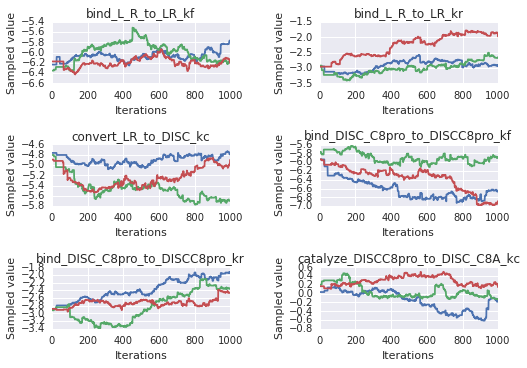

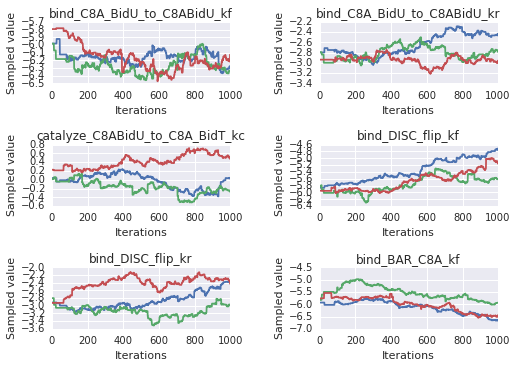

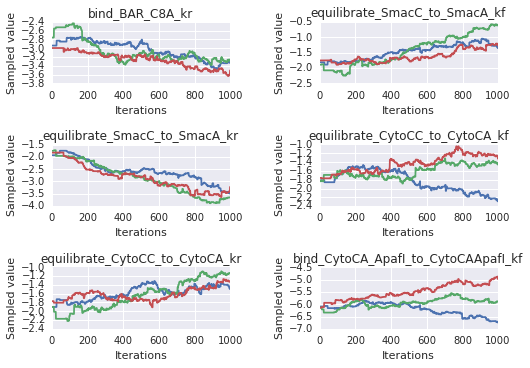

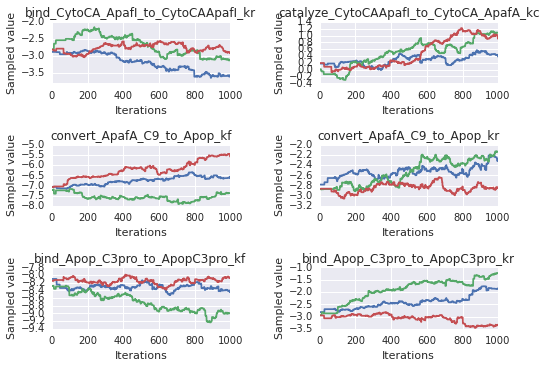

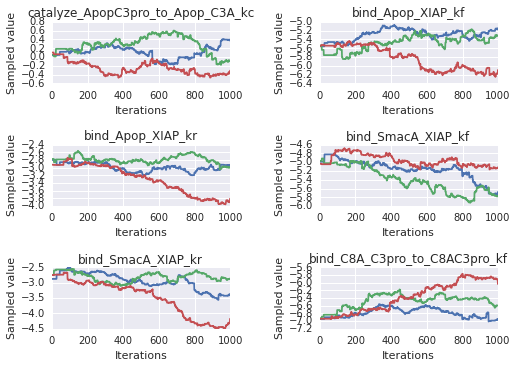

...

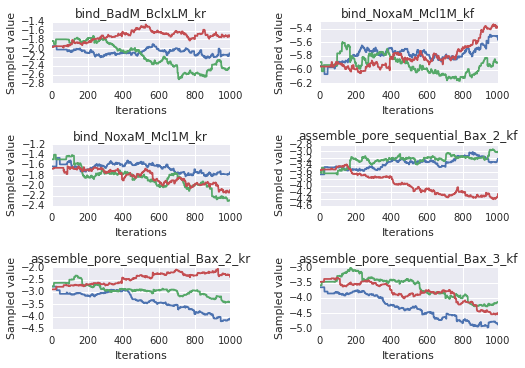

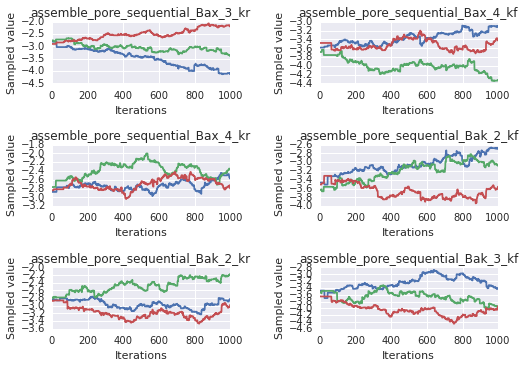

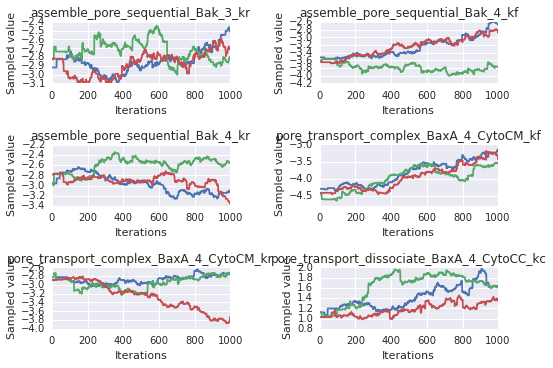

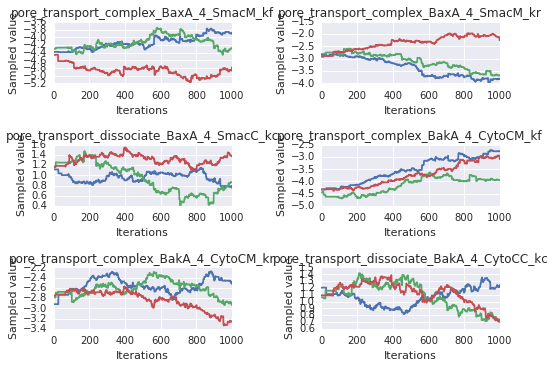

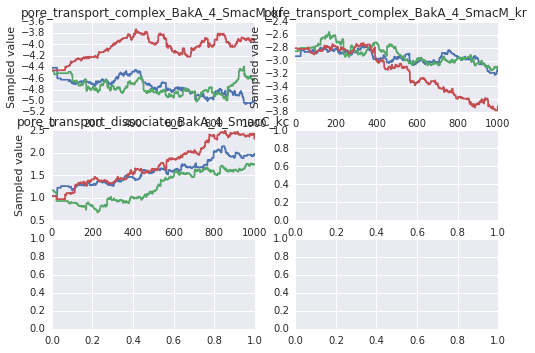

In [10]:
sample_plots(param_trace_dicts['a'])

In [11]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=600, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


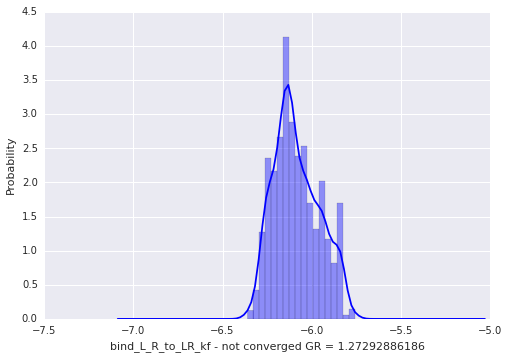

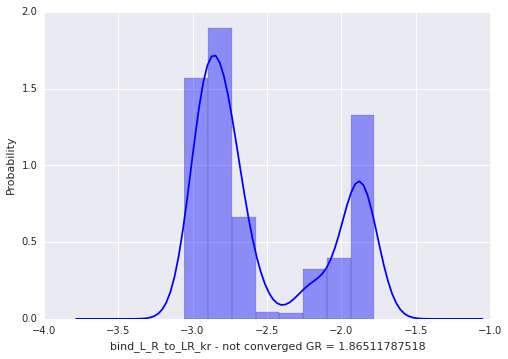

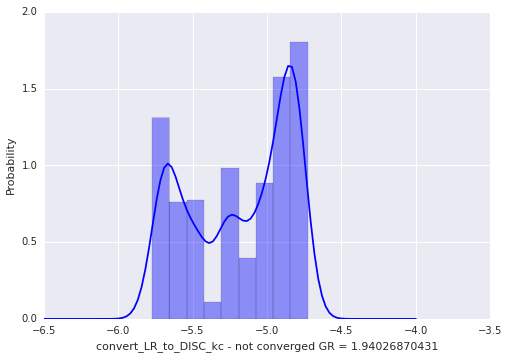

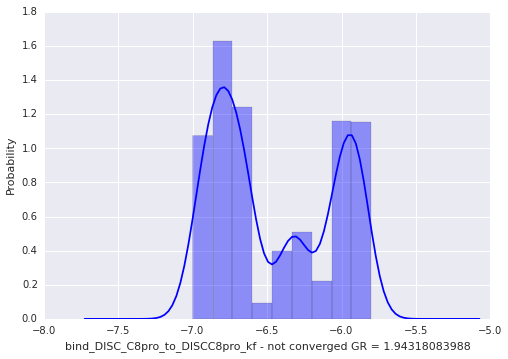

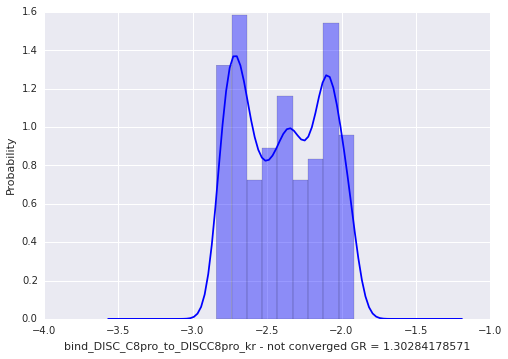

...

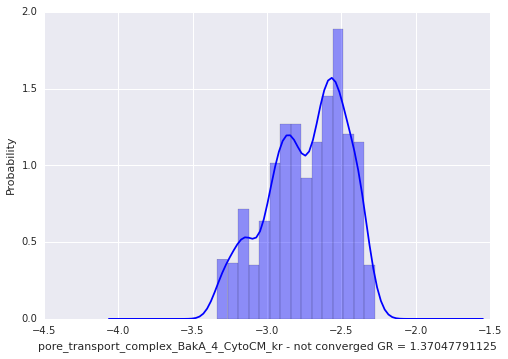

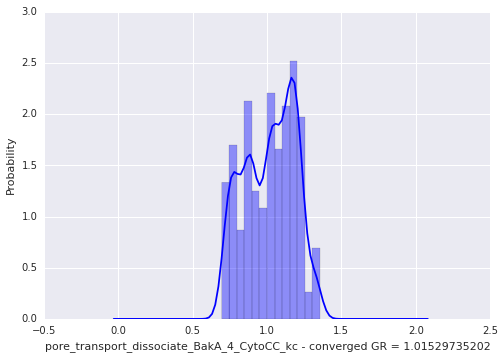

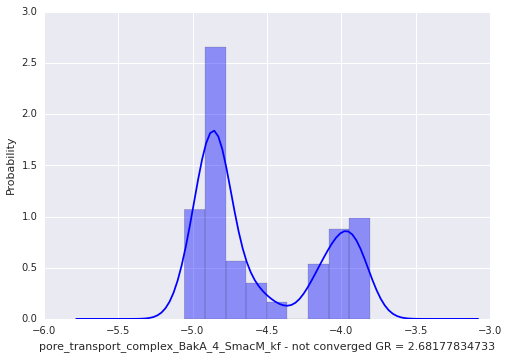

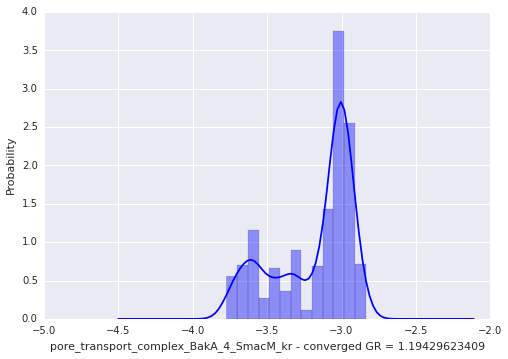

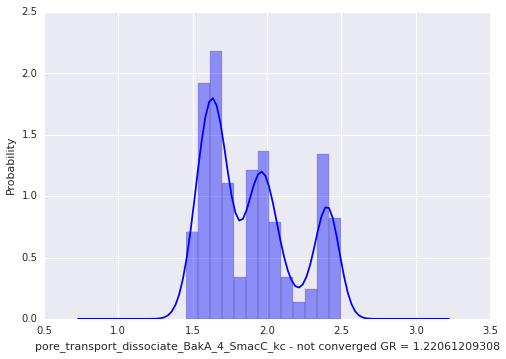

In [12]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [14]:
traces['a'][1][:,0]

array([-6.3521298 , -6.3521298 , -6.3521298 , -6.3521298 , -6.3521298 ,
       -6.3521298 , -6.3521298 , -6.3521298 , -6.3521298 , -6.3521298 ,
       -6.3521298 , -6.3521298 , -6.33240704, -6.33240704, -6.33240704,
       -6.33240704, -6.33240704, -6.33240704, -6.33240704, -6.33240704,
       -6.33240704, -6.33240704, -6.33240704, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28064354,
       -6.28064354, -6.28064354, -6.28064354, -6.28064354, -6.28

In [7]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

1000
3
1000


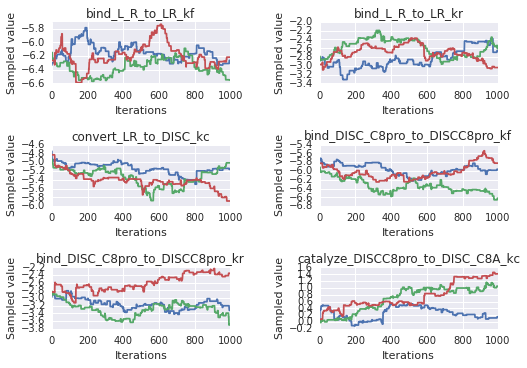

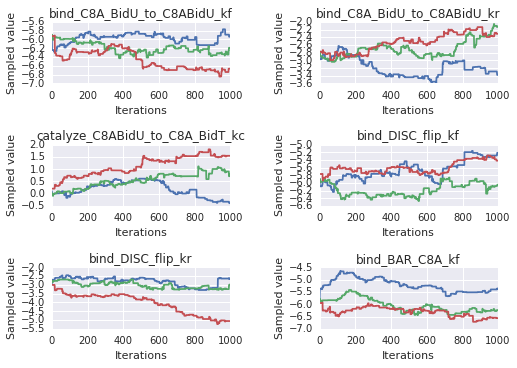

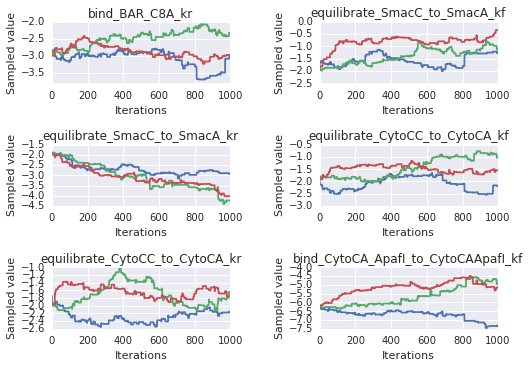

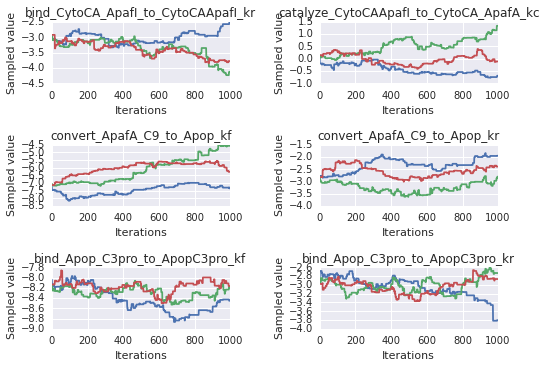

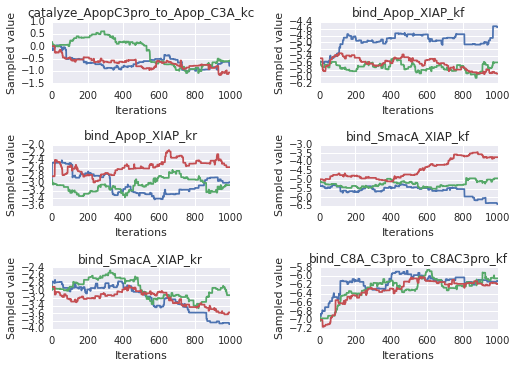

...

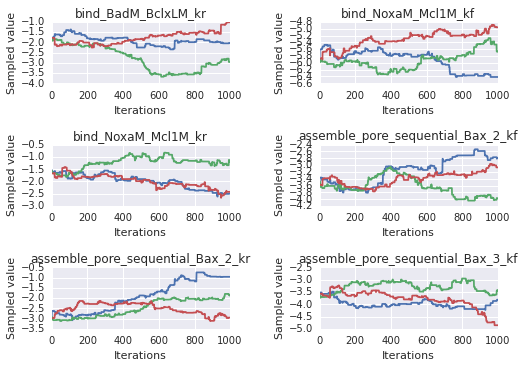

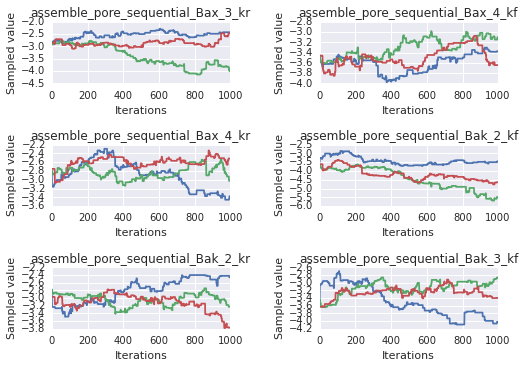

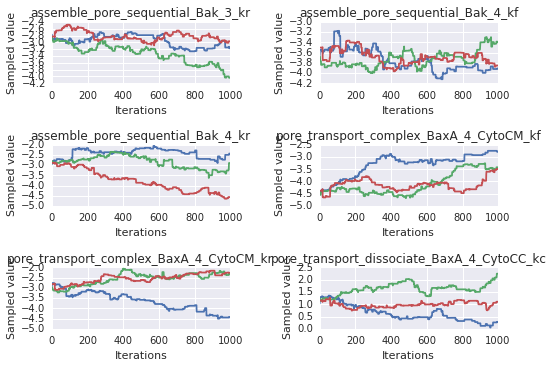

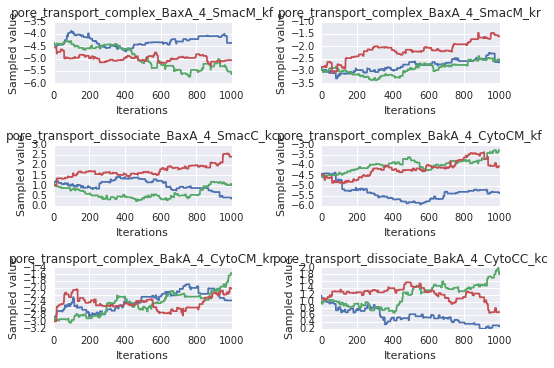

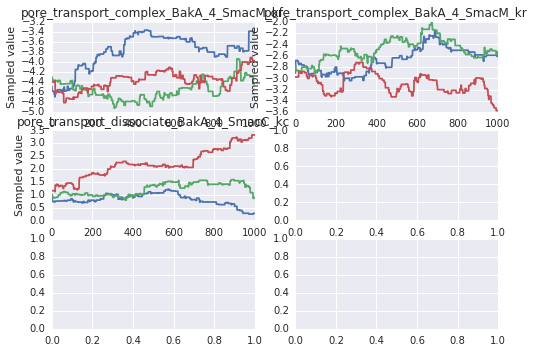

In [8]:
sample_plots(param_trace_dicts['a'])

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


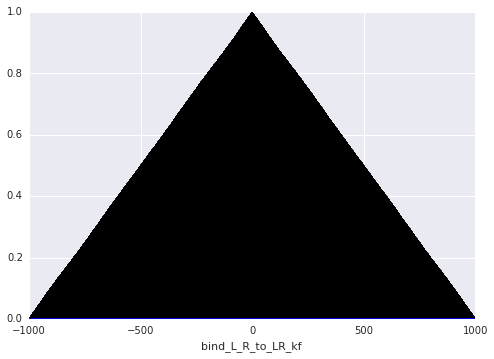

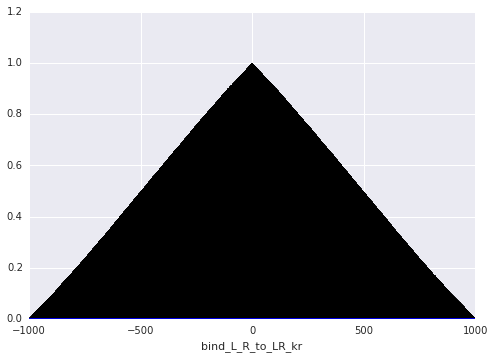

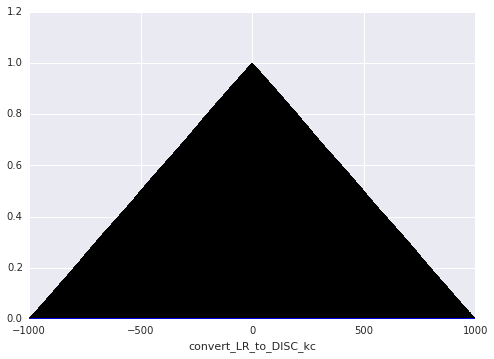

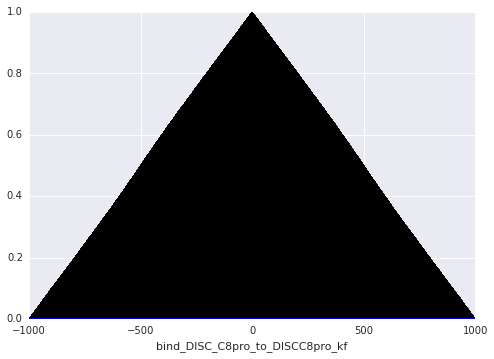

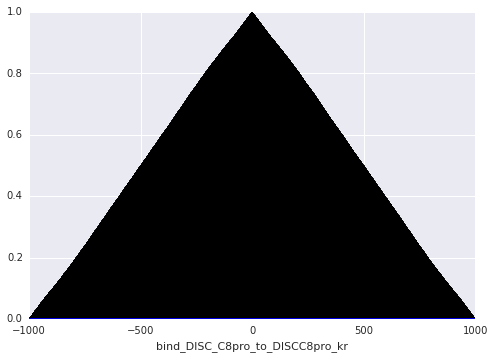

...

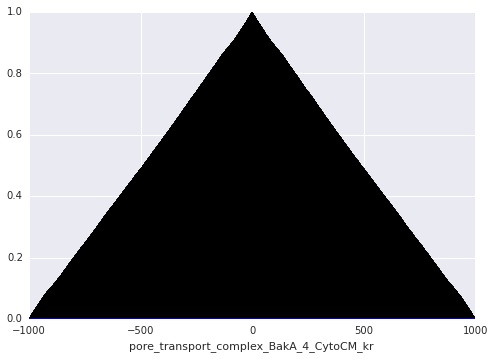

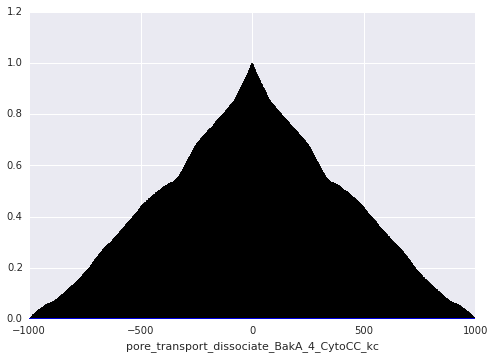

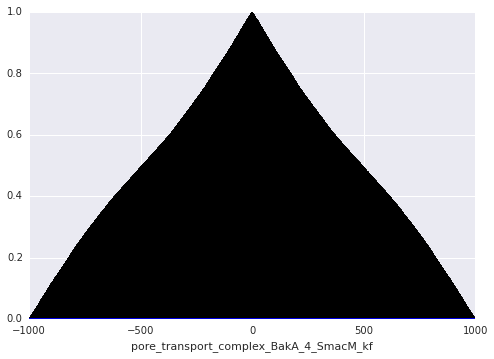

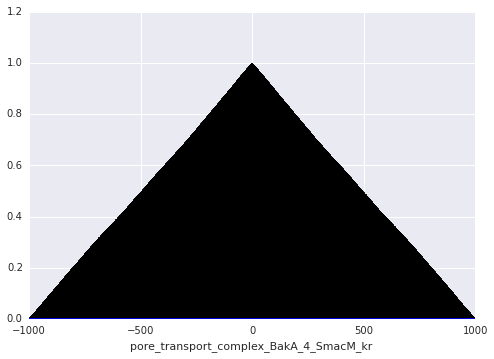

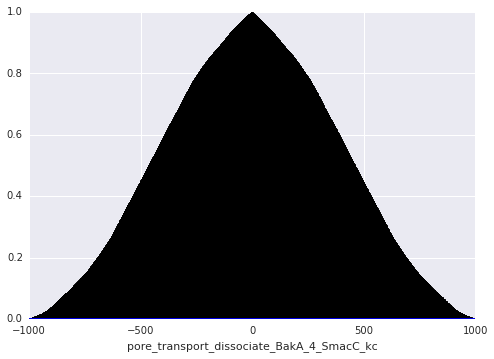

In [9]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

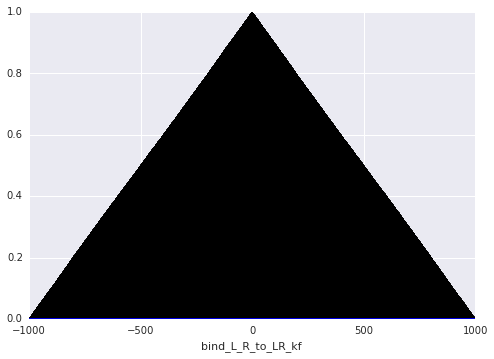

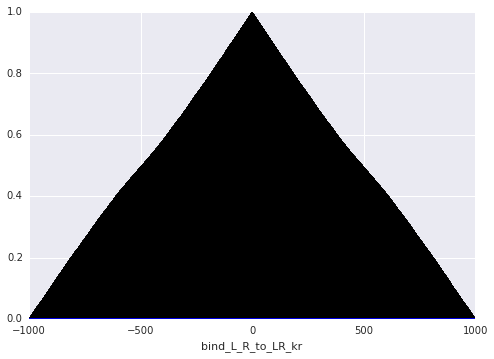

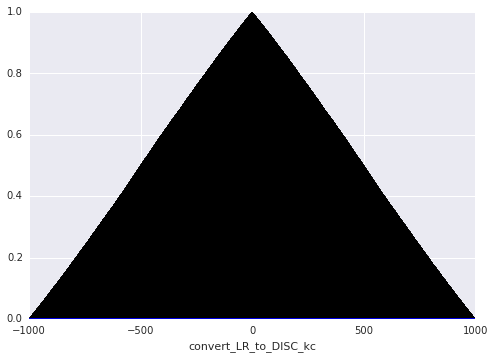

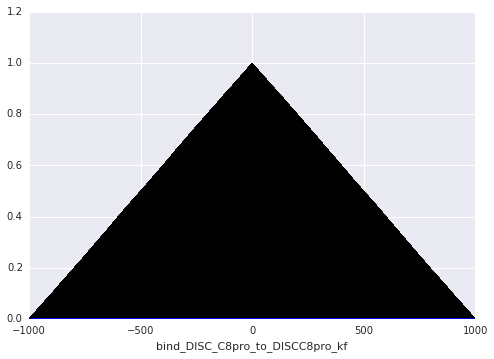

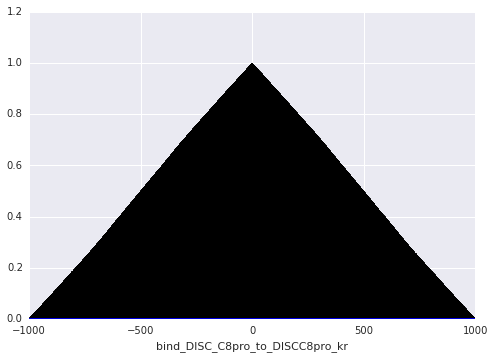

...

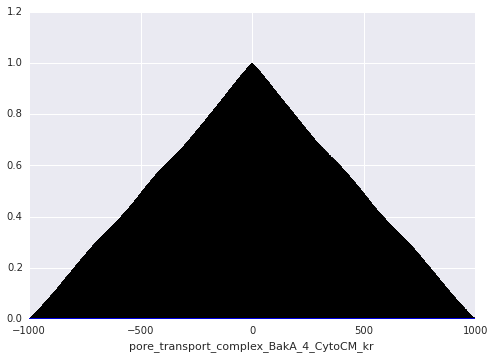

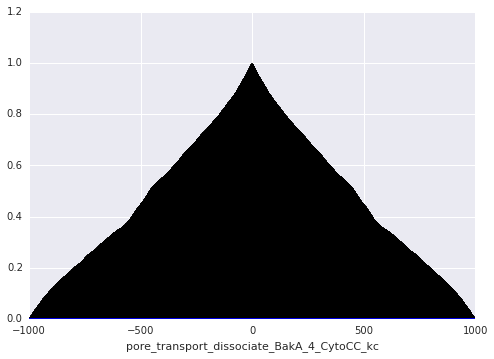

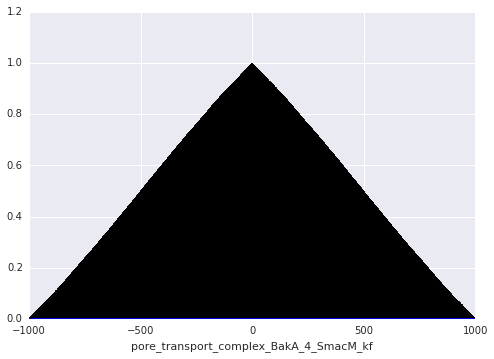

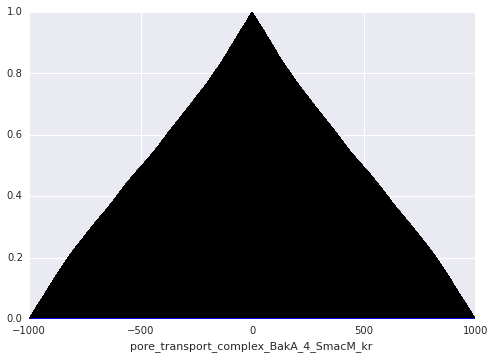

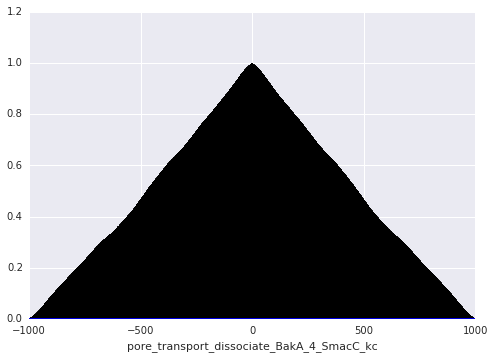

In [10]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

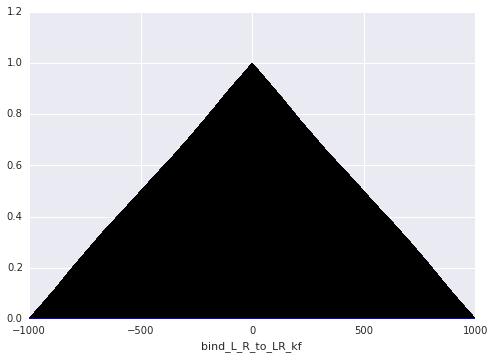

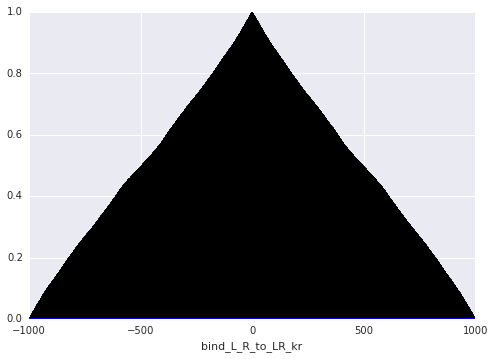

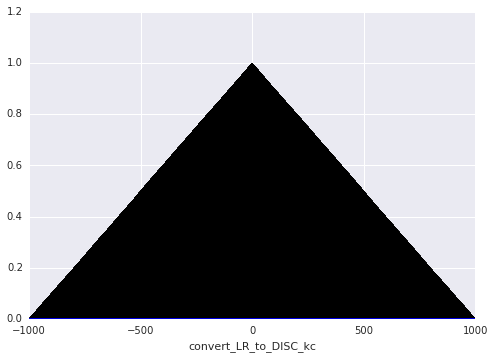

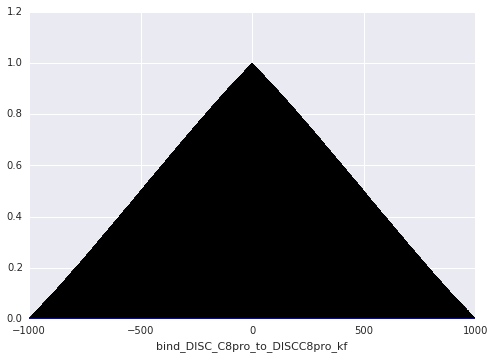

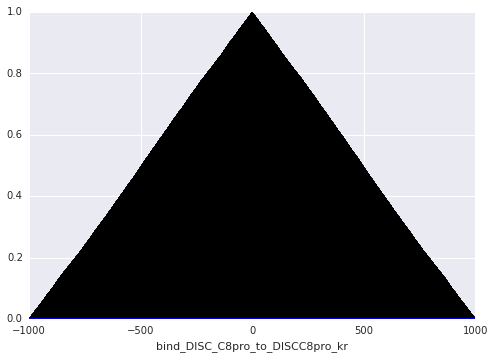

...

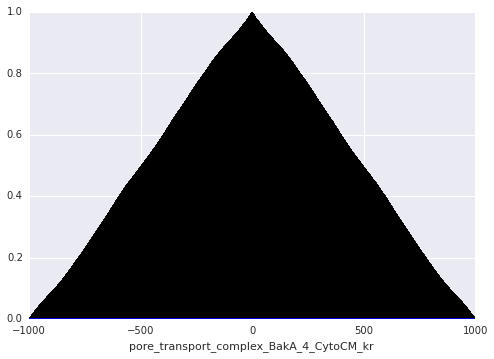

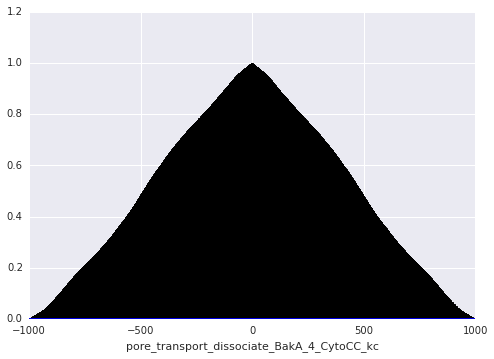

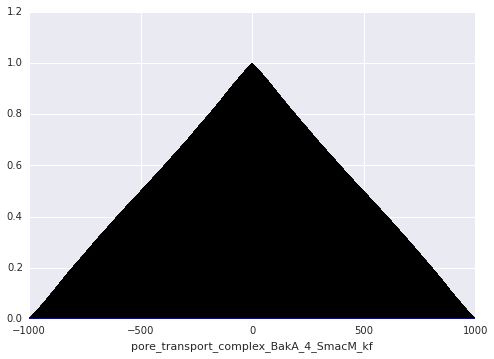

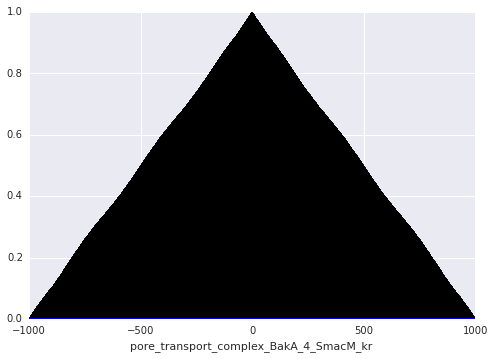

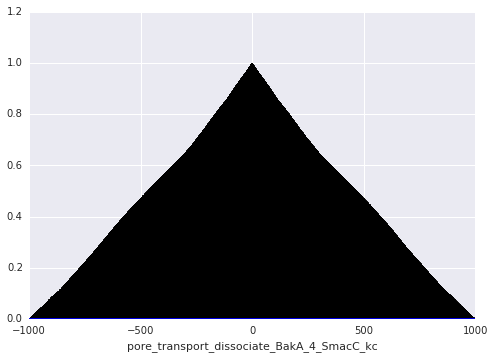

In [11]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [12]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
for dim in range(len(traces['a'][0][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][0])):
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  128  acceptance rate:  0.128
N acceptances for parameter:  bind_L_R_to_LR_kr  =  120  acceptance rate:  0.12
N acceptances for parameter:  convert_LR_to_DISC_kc  =  95  acceptance rate:  0.095
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  103  acceptance rate:  0.103
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  121  acceptance rate:  0.121
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  131  acceptance rate:  0.131
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  114  acceptance rate:  0.114
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  121  acceptance rate:  0.121
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  127  acceptance rate:  0.127
N acceptances for parameter:  bind_DISC_flip_kf  =  115  acceptance rate:  0.115
N acceptances for parameter:  bind_DISC_flip_kr  =  118  acceptance rate:  0.118
N acceptances for parameter: 

array([ 0.128,  0.12 ,  0.095,  0.103,  0.121,  0.131,  0.114,  0.121,
        0.127,  0.115,  0.118,  0.111,  0.124,  0.121,  0.12 ,  0.109,
        0.12 ,  0.115,  0.118,  0.119,  0.113,  0.102,  0.117,  0.123,
        0.117,  0.118,  0.108,  0.125,  0.115,  0.109,  0.134,  0.114,
        0.119,  0.113,  0.118,  0.12 ,  0.113,  0.115,  0.108,  0.115,
        0.114,  0.113,  0.119,  0.129,  0.127,  0.127,  0.111,  0.124,
        0.132,  0.121,  0.117,  0.12 ,  0.121,  0.125,  0.114,  0.114,
        0.12 ,  0.124,  0.11 ,  0.124,  0.115,  0.111,  0.122,  0.127,
        0.117,  0.112,  0.107,  0.104,  0.112,  0.118,  0.123,  0.112,
        0.11 ,  0.124,  0.135,  0.124,  0.125,  0.126,  0.11 ,  0.106,
        0.115,  0.119,  0.123,  0.121,  0.132,  0.116,  0.127,  0.124,
        0.123,  0.114,  0.12 ,  0.126,  0.118,  0.126,  0.121,  0.125,
        0.127,  0.125,  0.124,  0.114,  0.129,  0.119,  0.124,  0.12 ,
        0.122])

In [13]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
for dim in range(len(traces['a'][1][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  142  acceptance rate:  0.142
N acceptances for parameter:  bind_L_R_to_LR_kr  =  148  acceptance rate:  0.148
N acceptances for parameter:  convert_LR_to_DISC_kc  =  144  acceptance rate:  0.144
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  143  acceptance rate:  0.143
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  150  acceptance rate:  0.15
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  156  acceptance rate:  0.156
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  128  acceptance rate:  0.128
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  145  acceptance rate:  0.145
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  147  acceptance rate:  0.147
N acceptances for parameter:  bind_DISC_flip_kf  =  145  acceptance rate:  0.145
N acceptances for parameter:  bind_DISC_flip_kr  =  156  acceptance rate:  0.156
N acceptances for parameter:

array([ 0.142,  0.148,  0.144,  0.143,  0.15 ,  0.156,  0.128,  0.145,
        0.147,  0.145,  0.156,  0.148,  0.17 ,  0.146,  0.143,  0.161,
        0.149,  0.15 ,  0.15 ,  0.154,  0.151,  0.159,  0.156,  0.158,
        0.16 ,  0.151,  0.156,  0.154,  0.133,  0.144,  0.153,  0.167,
        0.154,  0.161,  0.164,  0.151,  0.153,  0.158,  0.136,  0.146,
        0.151,  0.14 ,  0.15 ,  0.154,  0.137,  0.148,  0.155,  0.158,
        0.168,  0.155,  0.158,  0.145,  0.15 ,  0.142,  0.151,  0.15 ,
        0.156,  0.158,  0.14 ,  0.155,  0.165,  0.155,  0.137,  0.153,
        0.15 ,  0.155,  0.153,  0.149,  0.152,  0.148,  0.167,  0.152,
        0.148,  0.155,  0.151,  0.137,  0.161,  0.156,  0.158,  0.157,
        0.158,  0.153,  0.135,  0.163,  0.159,  0.152,  0.153,  0.143,
        0.154,  0.156,  0.157,  0.146,  0.155,  0.164,  0.154,  0.142,
        0.157,  0.158,  0.148,  0.145,  0.16 ,  0.145,  0.158,  0.148,
        0.158])

In [14]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  130  acceptance rate:  0.13
N acceptances for parameter:  bind_L_R_to_LR_kr  =  130  acceptance rate:  0.13
N acceptances for parameter:  convert_LR_to_DISC_kc  =  107  acceptance rate:  0.107
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  114  acceptance rate:  0.114
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  133  acceptance rate:  0.133
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  116  acceptance rate:  0.116
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  120  acceptance rate:  0.12
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  126  acceptance rate:  0.126
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  125  acceptance rate:  0.125
N acceptances for parameter:  bind_DISC_flip_kf  =  121  acceptance rate:  0.121
N acceptances for parameter:  bind_DISC_flip_kr  =  139  acceptance rate:  0.139
N acceptances for parameter:  

array([ 0.13 ,  0.13 ,  0.107,  0.114,  0.133,  0.116,  0.12 ,  0.126,
        0.125,  0.121,  0.139,  0.125,  0.128,  0.121,  0.127,  0.13 ,
        0.125,  0.143,  0.133,  0.132,  0.126,  0.134,  0.123,  0.13 ,
        0.137,  0.126,  0.139,  0.141,  0.132,  0.116,  0.127,  0.125,
        0.11 ,  0.139,  0.139,  0.143,  0.128,  0.138,  0.128,  0.137,
        0.131,  0.116,  0.124,  0.138,  0.141,  0.133,  0.136,  0.13 ,
        0.125,  0.13 ,  0.128,  0.124,  0.123,  0.126,  0.14 ,  0.128,
        0.118,  0.124,  0.143,  0.148,  0.136,  0.122,  0.139,  0.126,
        0.134,  0.135,  0.134,  0.131,  0.132,  0.139,  0.133,  0.139,
        0.139,  0.141,  0.131,  0.138,  0.127,  0.132,  0.132,  0.13 ,
        0.125,  0.131,  0.143,  0.132,  0.122,  0.123,  0.12 ,  0.13 ,
        0.142,  0.118,  0.135,  0.125,  0.127,  0.134,  0.13 ,  0.141,
        0.133,  0.131,  0.141,  0.148,  0.133,  0.13 ,  0.131,  0.142,
        0.14 ])